<a href="https://colab.research.google.com/github/ruudtje21/html-portofolio/blob/main/klasifikasi_kemasan_obat_terbaru_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Pharmaceutical Drug Image Classification with YOLOv8

In [13]:
import os, shutil, random
from pathlib import Path
from PIL import Image, ImageEnhance, ImageFilter
import numpy as np

img_dir = "/root/.cache/kagglehub/datasets/abdelrahmanabdelalem/pharmaceutical-drugs/versions/1/images"
out_dir = "/content/pharma_dataset"

images = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png','.jpg','.jpeg'))]
print(f"Total gambar asli: {len(images)}")

def augment(img):
    """Buat 1 variasi augmentasi dari sebuah gambar."""
    # Random flip
    if random.random() > 0.5:
        img = img.transpose(Image.FLIP_LEFT_RIGHT)
    # Random rotasi
    angle = random.uniform(-30, 30)
    img = img.rotate(angle, expand=False, fillcolor=(255,255,255))
    # Random brightness
    img = ImageEnhance.Brightness(img).enhance(random.uniform(0.7, 1.3))
    # Random contrast
    img = ImageEnhance.Contrast(img).enhance(random.uniform(0.7, 1.3))
    # Random blur ringan
    if random.random() > 0.7:
        img = img.filter(ImageFilter.GaussianBlur(radius=random.uniform(0.5, 1.5)))
    return img

AUG_PER_IMAGE = 30  # 1 gambar → 30 variasi → total ~6450 gambar

random.seed(42)
total = 0
for fname in images:
    cls     = Path(fname).stem
    src     = Image.open(os.path.join(img_dir, fname)).convert("RGB")

    # Split: 21 train, 6 val, 3 test
    splits  = {"train": 21, "val": 6, "test": 3}
    idx     = 0
    for split, count in splits.items():
        dest = Path(out_dir) / split / cls
        dest.mkdir(parents=True, exist_ok=True)
        for i in range(count):
            aug = augment(src)
            aug.save(dest / f"{cls}_{idx:03d}.jpg")
            idx += 1
            total += 1

print(f"✅ Total gambar setelah augmentasi: {total}")
print(f"   Kelas: {len(images)}")
print(f"   Per kelas: ~30 gambar (21 train / 6 val / 3 test)")

Total gambar asli: 215
✅ Total gambar setelah augmentasi: 6450
   Kelas: 215
   Per kelas: ~30 gambar (21 train / 6 val / 3 test)


In [14]:
from ultralytics import YOLO

model = YOLO("yolov8n-cls.yaml")

model.train(
    data    = "/content/pharma_dataset",
    epochs  = 50,
    imgsz   = 224,
    batch   = 32,
    project = "/content/pharma_runs",
    name    = "yolov8_pharma",
    plots   = True,
)

YOLOv8n-cls summary: 56 layers, 2,719,288 parameters, 2,719,288 gradients, 4.4 GFLOPs
Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/pharma_dataset, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.yaml, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yol

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e2781358a40>
curves: []
curves_results: []
fitness: 0.9763565957546234
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9565891623497009, 'metrics/accuracy_top5': 0.9961240291595459, 'fitness': 0.9763565957546234}
save_dir: PosixPath('/content/pharma_runs/yolov8_pharma')
speed: {'preprocess': 0.06895511860491314, 'inference': 0.28702496046517884, 'loss': 0.00025826976726357526, 'postprocess': 0.00022466201522730944}
top1: 0.9565891623497009
top5: 0.9961240291595459

In [15]:
metrics = model.val(data="/content/pharma_dataset", split="test")
print(f"Top-1 Accuracy : {metrics.top1*100:.1f}%")
print(f"Top-5 Accuracy : {metrics.top5*100:.1f}%")

Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLOv8n-cls summary (fused): 30 layers, 1,710,295 parameters, 0 gradients, 3.5 GFLOPs
train: /content/pharma_dataset/train... found 4515 images in 215 classes ✅ 
val: /content/pharma_dataset/val... found 1290 images in 215 classes ✅ 
test: /content/pharma_dataset/test... found 645 images in 215 classes ✅ 
test: Fast image access ✅ (ping: 0.0±0.0 ms, read: 427.4±118.3 MB/s, size: 10.7 KB)
test: Scanning /content/pharma_dataset/test... 645 images, 0 corrupt: 100% ━━━━━━━━━━━━ 645/645 3.4Kit/s 0.2s
test: New cache created: /content/pharma_dataset/test.cache
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 41/41 41.3it/s 1.0s
                   all      0.932      0.995
Speed: 0.1ms preprocess, 1.0ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/classify/val
Top-1 Accuracy : 93.2%
Top-5 Accuracy : 99.5%


In [16]:
# Prediksi 1 gambar dari test set
import os
from pathlib import Path

# Ambil 1 gambar sample
sample = list(Path("/content/pharma_dataset/test").rglob("*.jpg"))[0]
print(f"Gambar: {sample.parent.name}")  # nama kelas asli

results = model.predict(str(sample), verbose=False)
r = results[0]
predicted = r.names[int(r.probs.top1)]
confidence = float(r.probs.top1conf)

print(f"Prediksi  : {predicted}")
print(f"Confidence: {confidence*100:.1f}%")
print(f"Benar?    : {'✅' if predicted == sample.parent.name else '❌'}")

Gambar: Arcoxia 60-90
Prediksi  : Arcoxia 60-90
Confidence: 95.4%
Benar?    : ✅


/tmp/ipykernel_572/4059699658.py:34: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/4059699658.py:35: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/hasil_klasifikasi.png", dpi=150, bbox_inches="tight")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


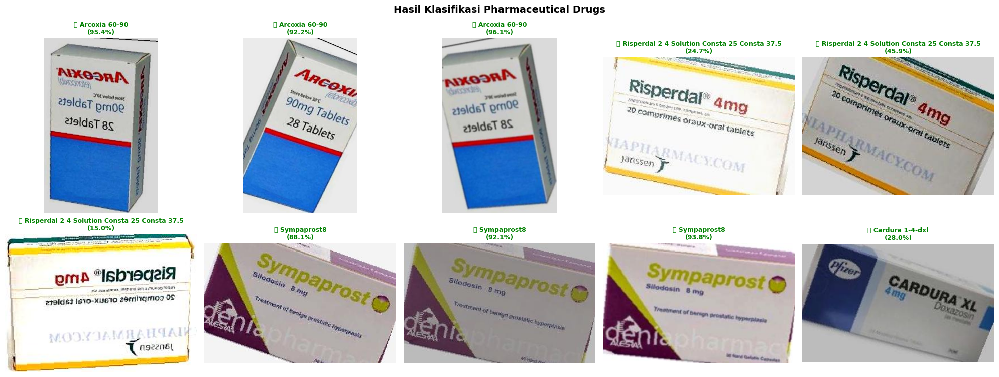

✅ Gambar tersimpan di /content/hasil_klasifikasi.png


In [17]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

# Ambil 10 gambar sample dari test set
samples = list(Path("/content/pharma_dataset/test").rglob("*.jpg"))[:10]

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for i, sample in enumerate(samples):
    # Prediksi
    r = model.predict(str(sample), verbose=False)[0]
    predicted  = r.names[int(r.probs.top1)]
    confidence = float(r.probs.top1conf)
    actual     = sample.parent.name

    # Tampilkan gambar
    img = Image.open(sample)
    axes[i].imshow(img)
    axes[i].axis("off")

    # Warna hijau kalau benar, merah kalau salah
    benar = predicted == actual
    color = "green" if benar else "red"
    status = "✅" if benar else "❌"

    axes[i].set_title(
        f"{status} {predicted}\n({confidence*100:.1f}%)",
        color=color, fontsize=9, fontweight="bold"
    )

plt.suptitle("Hasil Klasifikasi Pharmaceutical Drugs", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("/content/hasil_klasifikasi.png", dpi=150, bbox_inches="tight")
plt.show()
print("✅ Gambar tersimpan di /content/hasil_klasifikasi.png")

/tmp/ipykernel_572/3190560858.py:34: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/3190560858.py:35: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/hasil_klasifikasi_20.png", dpi=150, bbox_inches="tight")


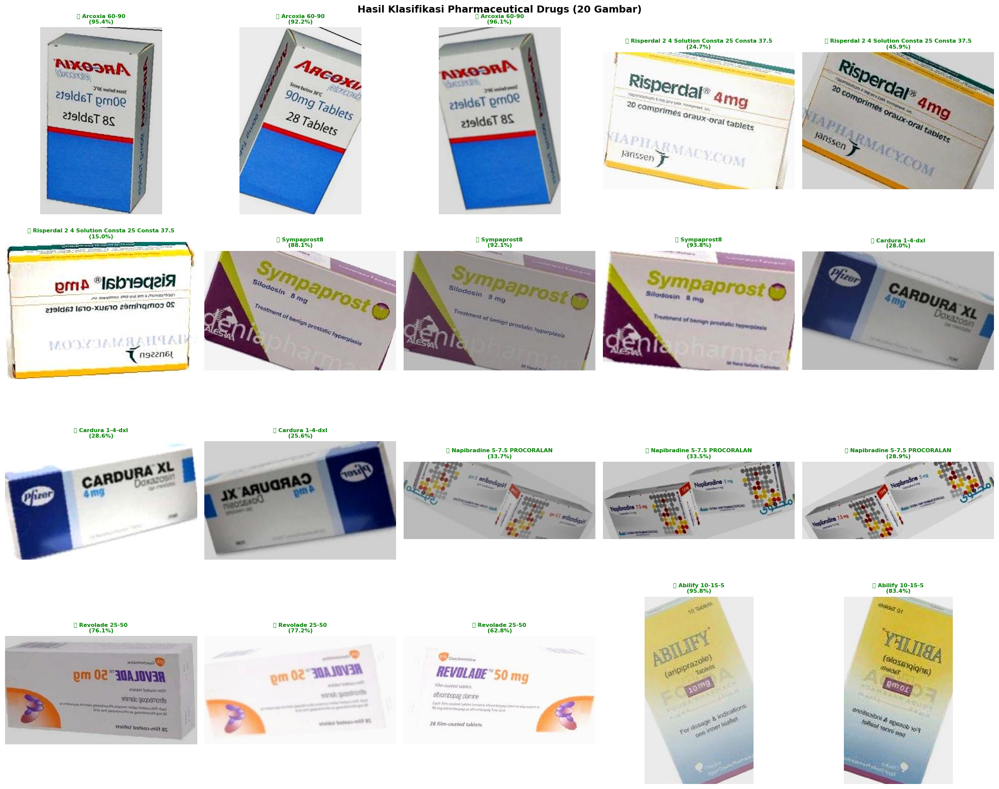

✅ Tersimpan di /content/hasil_klasifikasi_20.png


In [18]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

# 20 gambar sample dari test set
samples = list(Path("/content/pharma_dataset/test").rglob("*.jpg"))[:20]

fig, axes = plt.subplots(4, 5, figsize=(20, 16))
axes = axes.flatten()

for i, sample in enumerate(samples):
    # Prediksi
    r = model.predict(str(sample), verbose=False)[0]
    predicted  = r.names[int(r.probs.top1)]
    confidence = float(r.probs.top1conf)
    actual     = sample.parent.name

    # Tampilkan gambar
    img = Image.open(sample)
    axes[i].imshow(img)
    axes[i].axis("off")

    # Warna hijau kalau benar, merah kalau salah
    benar  = predicted == actual
    color  = "green" if benar else "red"
    status = "✅" if benar else "❌"

    axes[i].set_title(
        f"{status} {predicted}\n({confidence*100:.1f}%)",
        color=color, fontsize=8, fontweight="bold"
    )

plt.suptitle("Hasil Klasifikasi Pharmaceutical Drugs (20 Gambar)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig("/content/hasil_klasifikasi_20.png", dpi=150, bbox_inches="tight")
plt.show()
print("✅ Tersimpan di /content/hasil_klasifikasi_20.png")

Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
train: /content/pharma_dataset/train... found 4515 images in 215 classes ✅ 
val: /content/pharma_dataset/val... found 1290 images in 215 classes ✅ 
test: /content/pharma_dataset/test... found 645 images in 215 classes ✅ 
test: Fast image access ✅ (ping: 0.0±0.0 ms, read: 581.7±212.9 MB/s, size: 10.7 KB)
test: Scanning /content/pharma_dataset/test... 645 images, 0 corrupt: 100% ━━━━━━━━━━━━ 645/645 270.5Mit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 41/41 49.7it/s 0.8s
                   all      0.932      0.995
Speed: 0.2ms preprocess, 0.7ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/classify/val-2


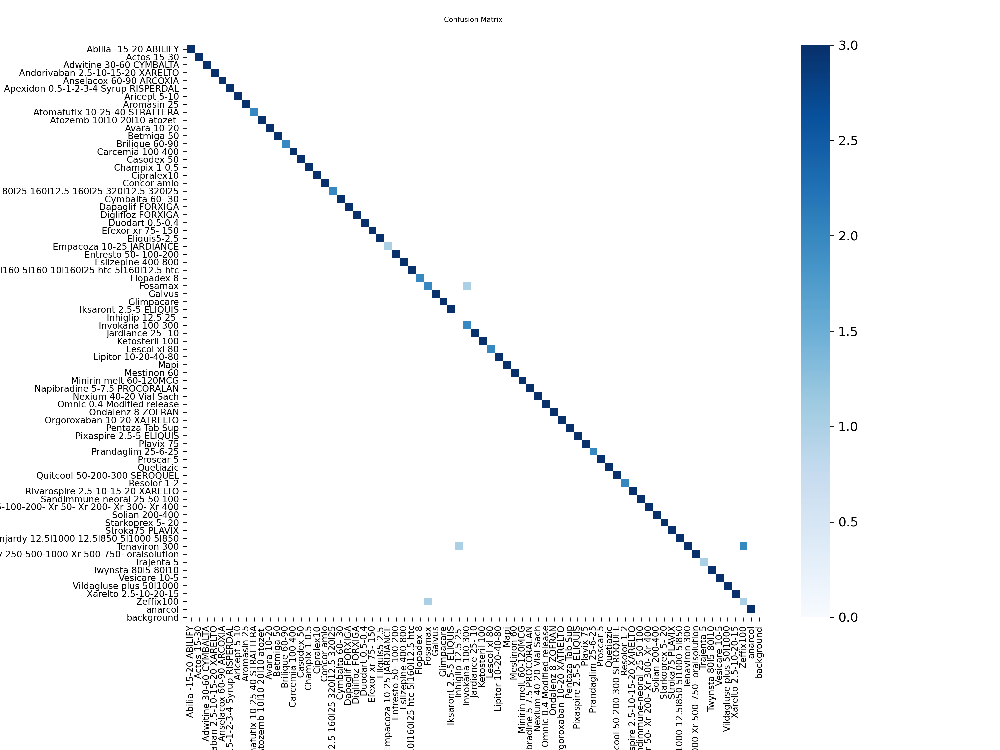

In [19]:
import matplotlib.pyplot as plt
from ultralytics.utils.plotting import plot_results

# Plot confusion matrix
conf_matrix = model.val(data="/content/pharma_dataset", split="test", plots=True)

# Lihat hasil plot
from IPython.display import Image
Image("/content/runs/classify/val/confusion_matrix.png")

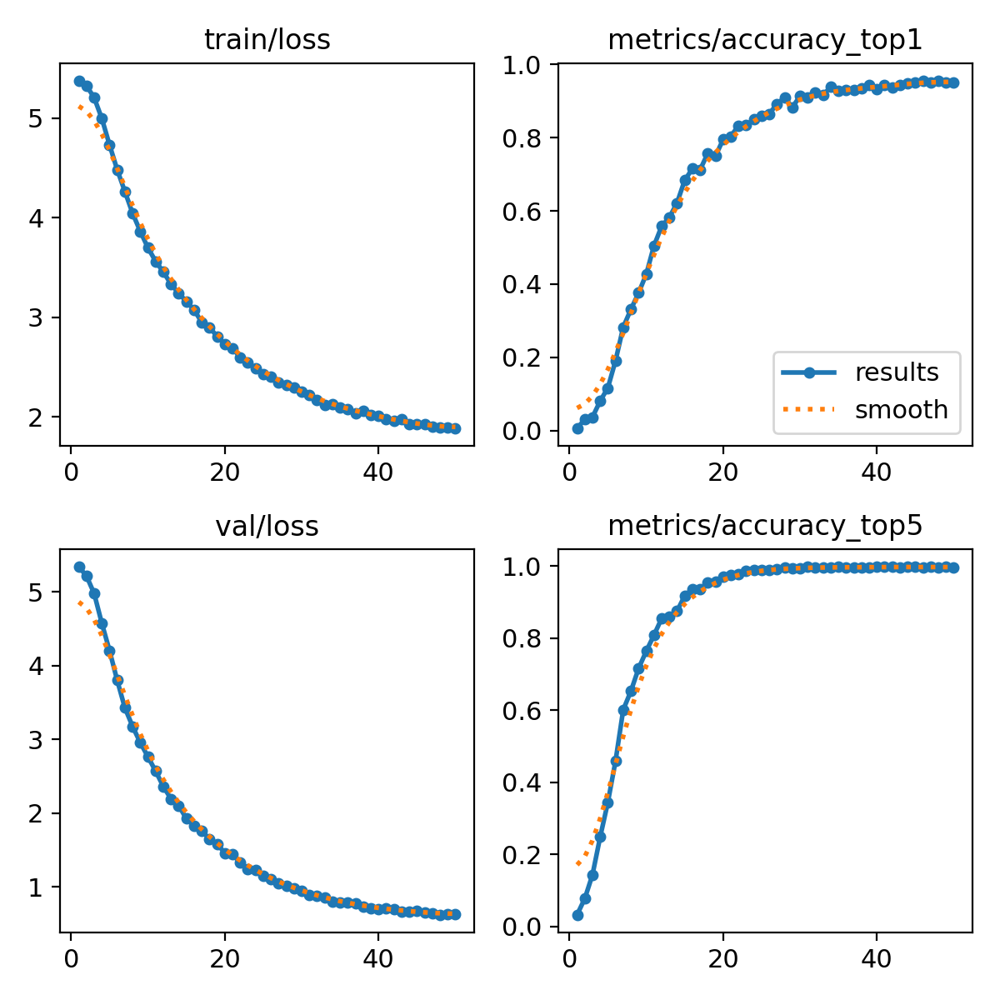

In [20]:
Image("/content/pharma_runs/yolov8_pharma/results.png")

/tmp/ipykernel_572/3362104553.py:37: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/3362104553.py:37: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/3362104553.py:37: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/3362104553.py:38: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight",
/tmp/ipykernel_572/3362104553.py:38: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight",
/tmp/ipykernel_572/3362104553.py:38: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight",
/usr/local/li

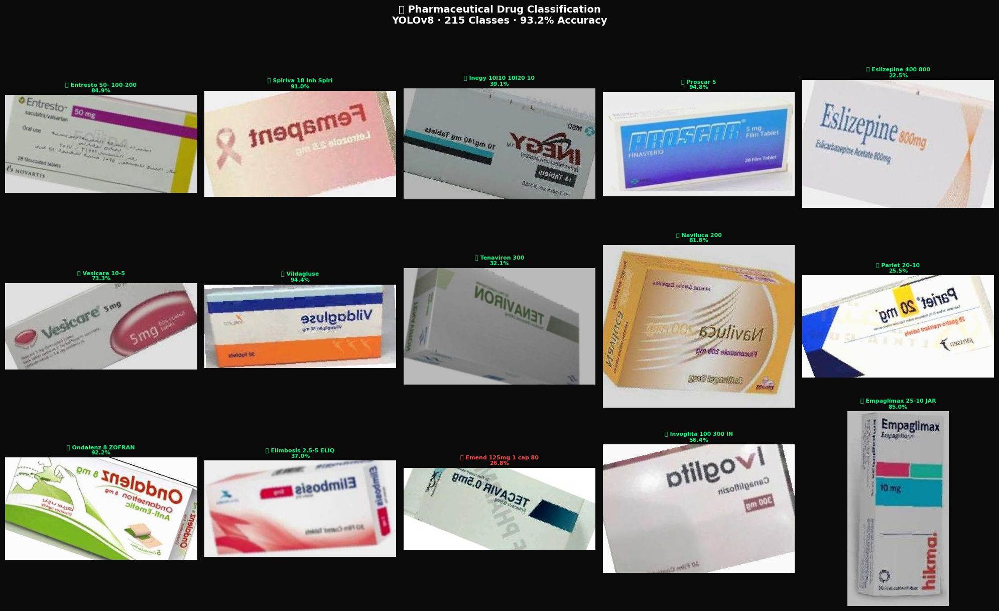

✅ Siap di-share!


In [21]:
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from pathlib import Path
import random

# Ambil gambar random yang beragam
all_samples = list(Path("/content/pharma_dataset/test").rglob("*.jpg"))
samples = random.sample(all_samples, 15)

fig, axes = plt.subplots(3, 5, figsize=(20, 12))
fig.patch.set_facecolor('#0a0a0a')  # background hitam
axes = axes.flatten()

for i, sample in enumerate(samples):
    r = model.predict(str(sample), verbose=False)[0]
    predicted  = r.names[int(r.probs.top1)]
    confidence = float(r.probs.top1conf)
    actual     = sample.parent.name
    benar      = predicted == actual

    img = PILImage.open(sample)
    axes[i].imshow(img)
    axes[i].axis("off")

    color  = "#00ff88" if benar else "#ff4444"
    status = "✅" if benar else "❌"
    axes[i].set_title(
        f"{status} {predicted[:20]}\n{confidence*100:.1f}%",
        color=color, fontsize=8, fontweight="bold",
        pad=4
    )

plt.suptitle(
    "🔬 Pharmaceutical Drug Classification\nYOLOv8 · 215 Classes · 93.2% Accuracy",
    fontsize=14, fontweight="bold", color="white", y=1.01
)
plt.tight_layout()
plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight",
            facecolor='#0a0a0a')
plt.show()
print("✅ Siap di-share!")

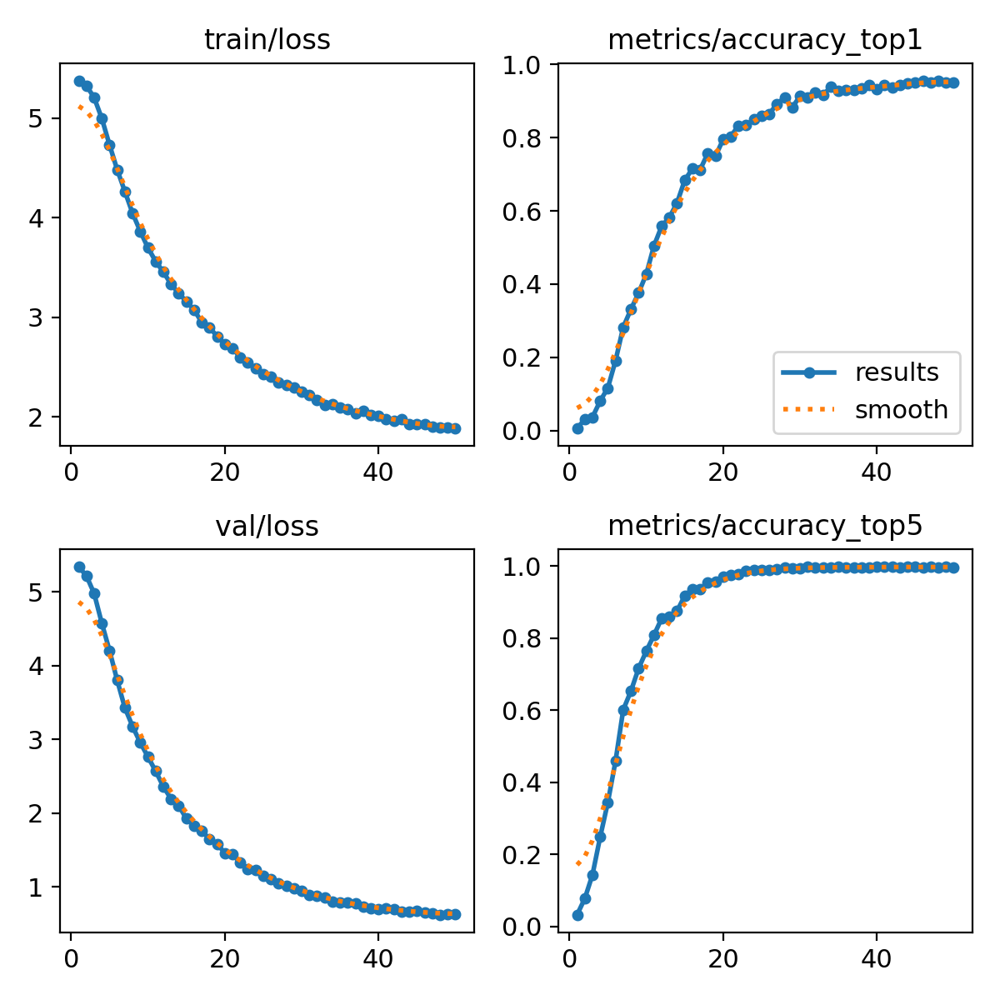

In [22]:
from IPython.display import Image
Image("/content/pharma_runs/yolov8_pharma/results.png")

Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
train: /content/pharma_dataset/train... found 4515 images in 215 classes ✅ 
val: /content/pharma_dataset/val... found 1290 images in 215 classes ✅ 
test: /content/pharma_dataset/test... found 645 images in 215 classes ✅ 
test: Fast image access ✅ (ping: 0.0±0.0 ms, read: 409.1±120.7 MB/s, size: 10.7 KB)
test: Scanning /content/pharma_dataset/test... 645 images, 0 corrupt: 100% ━━━━━━━━━━━━ 645/645 225.4Mit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 41/41 50.2it/s 0.8s
                   all      0.932      0.995
Speed: 0.2ms preprocess, 0.7ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/eval_plots


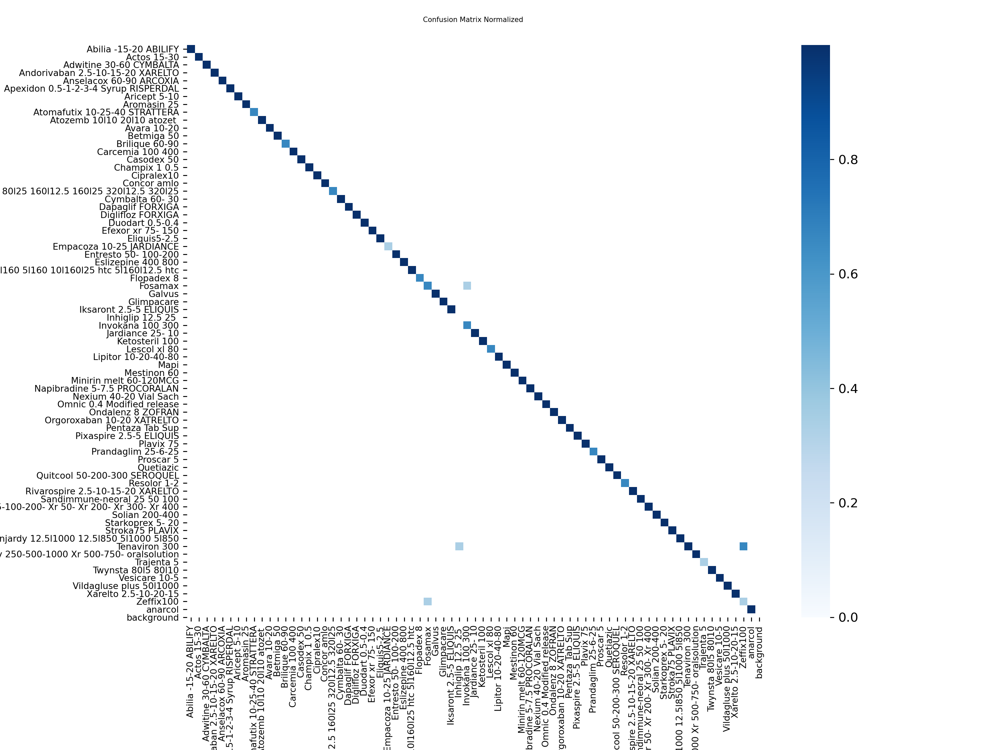

In [23]:
from ultralytics import YOLO

model.val(data="/content/pharma_dataset", split="test", plots=True, save_dir="/content/eval_plots")
Image("/content/eval_plots/confusion_matrix_normalized.png")

/tmp/ipykernel_572/2718095852.py:36: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/2718095852.py:36: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/2718095852.py:36: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_572/2718095852.py:37: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight", facecolor='#0a0a0a')
/tmp/ipykernel_572/2718095852.py:37: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight", facecolor='#0a0a0a')
/tmp/ipykernel_572/2718095852.py:37: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/linkedin_demo.png", d

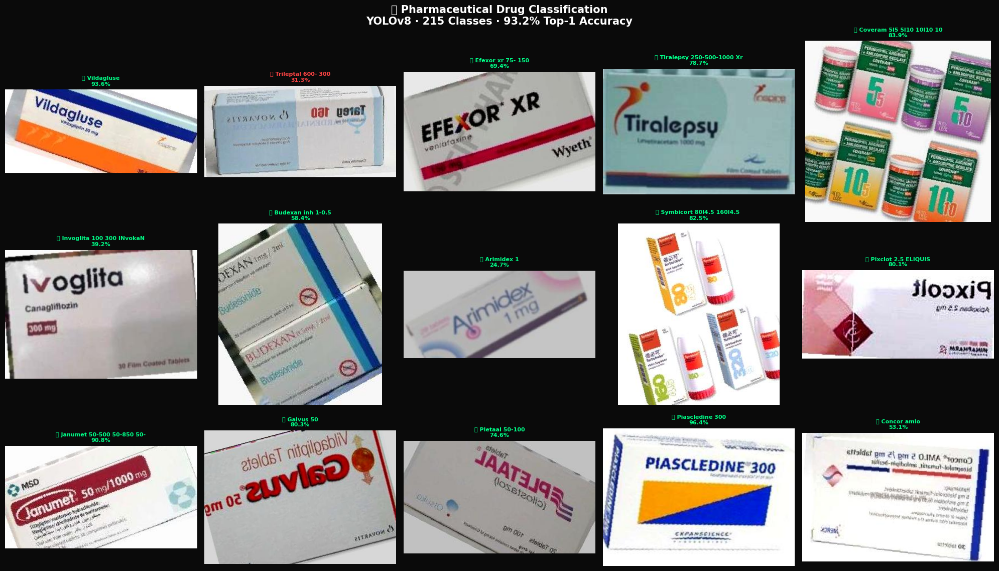

✅ Tersimpan di /content/linkedin_demo.png


In [24]:
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from pathlib import Path
import random

all_samples = list(Path("/content/pharma_dataset/test").rglob("*.jpg"))
samples = random.sample(all_samples, 15)

fig, axes = plt.subplots(3, 5, figsize=(20, 12))
fig.patch.set_facecolor('#0a0a0a')
axes = axes.flatten()

for i, sample in enumerate(samples):
    r = model.predict(str(sample), verbose=False)[0]
    predicted  = r.names[int(r.probs.top1)]
    confidence = float(r.probs.top1conf)
    actual     = sample.parent.name
    benar      = predicted == actual

    img = PILImage.open(sample)
    axes[i].imshow(img)
    axes[i].axis("off")
    axes[i].set_facecolor('#0a0a0a')

    color  = "#00ff88" if benar else "#ff4444"
    status = "✅" if benar else "❌"
    axes[i].set_title(
        f"{status} {predicted[:25]}\n{confidence*100:.1f}%",
        color=color, fontsize=8, fontweight="bold"
    )

plt.suptitle(
    "🔬 Pharmaceutical Drug Classification\nYOLOv8 · 215 Classes · 93.2% Top-1 Accuracy",
    fontsize=15, fontweight="bold", color="white"
)
plt.tight_layout()
plt.savefig("/content/linkedin_demo.png", dpi=200, bbox_inches="tight", facecolor='#0a0a0a')
plt.show()
print("✅ Tersimpan di /content/linkedin_demo.png")

In [25]:
from google.colab import drive
drive.mount('/content/drive')

import shutil, os

save_dir = "/content/drive/MyDrive/Pharma_YOLO"
os.makedirs(save_dir, exist_ok=True)

# Simpan semua file penting
shutil.copy("/content/pharma_runs/yolov8_pharma/weights/best.pt",   f"{save_dir}/best.pt")
shutil.copy("/content/linkedin_demo.png",                            f"{save_dir}/linkedin_demo.png")
shutil.copy("/content/pharma_runs/yolov8_pharma/results.png",       f"{save_dir}/training_results.png")

print("✅ Tersimpan di Google Drive/Pharma_YOLO/")
print(os.listdir(save_dir))

Mounted at /content/drive
✅ Tersimpan di Google Drive/Pharma_YOLO/
['best.pt', 'linkedin_demo.png', 'training_results.png']


In [6]:
!pip install kagglehub ultralytics -q

import kagglehub
path = kagglehub.dataset_download("abdelrahmanabdelalem/pharmaceutical-drugs")
print("Path:", path)

100%|██████████| 11.5M/11.5M [00:00<00:00, 122MB/s]

Extracting files...


Path: /root/.cache/kagglehub/datasets/abdelrahmanabdelalem/pharmaceutical-drugs/versions/1
